# Alberi decisionali

In [1]:
# Load libraries
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.tree import DecisionTreeClassifier # Import Decision Tree Classifier
from sklearn.model_selection import train_test_split # Import train_test_split function
from sklearn import metrics #Import scikit-learn metrics module for accuracy calculation



In [2]:
from google.colab import drive

drive.mount('/content/drive/')


ModuleNotFoundError: No module named 'google.colab'

In [4]:
# load dataset
df = pd.read_csv("dat/diabetes.csv")

In [5]:
df.head()

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
0,6,148,72,35,0,33.6,0.627,50,1
1,1,85,66,29,0,26.6,0.351,31,0
2,8,183,64,0,0,23.3,0.672,32,1
3,1,89,66,23,94,28.1,0.167,21,0
4,0,137,40,35,168,43.1,2.288,33,1


In [8]:
#split dataset in features and target variable
feature_cols = ['Pregnancies', 'Insulin', 'BMI', 'Age','Glucose','BloodPressure','DiabetesPedigreeFunction']
X = df[feature_cols] # Features
y = df.Outcome # Target variable

In [9]:
X= df.iloc[:,:8] #feature
y=df['Outcome'] # target

In [10]:
df.dtypes

Pregnancies                   int64
Glucose                       int64
BloodPressure                 int64
SkinThickness                 int64
Insulin                       int64
BMI                         float64
DiabetesPedigreeFunction    float64
Age                           int64
Outcome                       int64
dtype: object

In [11]:
# Split dataset into training set and test set
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=1) # 70% training and 30% test

## Data exploration

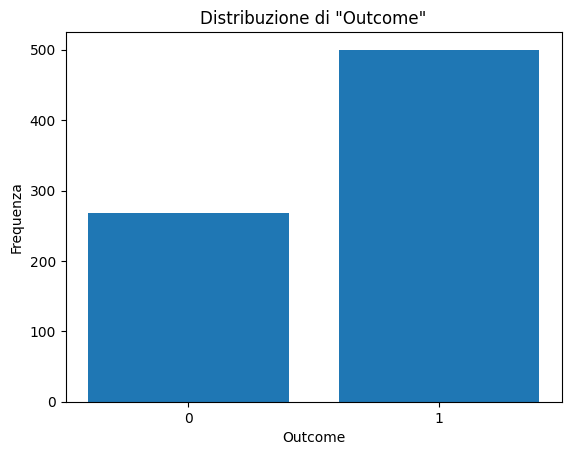

In [12]:
plt.bar(df["Outcome"].unique(), df["Outcome"].value_counts())
plt.xlabel("Outcome")
plt.ylabel("Frequenza")
plt.title("Distribuzione di \"Outcome\"")
plt.xticks([0, 1])
plt.show()

C:\Users\Davoleo\AppData\Local\Temp\ipykernel_22972\2680572214.py:2: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped = df.groupby(['glucose_group', 'Outcome']).size().unstack(fill_value=0)


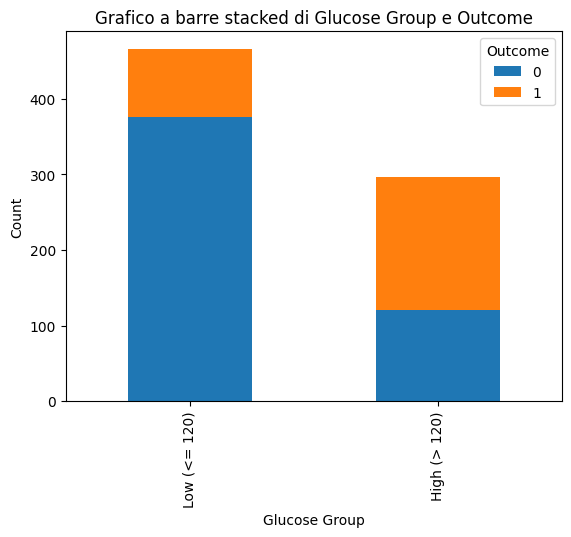

In [13]:
df['glucose_group'] = pd.cut(df['Glucose'], bins=[0, 125, float('inf')], labels=['Low (<= 120)', 'High (> 120)'])
grouped = df.groupby(['glucose_group', 'Outcome']).size().unstack(fill_value=0)
grouped.plot(kind='bar', stacked=True)
plt.title('Grafico a barre stacked di Glucose Group e Outcome')
plt.xlabel('Glucose Group')
plt.ylabel('Count')
plt.legend(title='Outcome', labels=['0', '1'])
plt.show()

## Creazione del training set e del test set

In [14]:
feature_names = set(df.columns) - set(["Outcome"])
list(feature_names)

['DiabetesPedigreeFunction',
 'BMI',
 'Glucose',
 'Insulin',
 'SkinThickness',
 'Pregnancies',
 'BloodPressure',
 'glucose_group',
 'Age']

In [15]:
df=df.drop(['glucose_group'], axis=1)   # Column created before to plot data
df.head()

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
0,6,148,72,35,0,33.6,0.627,50,1
1,1,85,66,29,0,26.6,0.351,31,0
2,8,183,64,0,0,23.3,0.672,32,1
3,1,89,66,23,94,28.1,0.167,21,0
4,0,137,40,35,168,43.1,2.288,33,1


In [16]:
from sklearn.model_selection import train_test_split

feature_names = list(set(df.columns) - set(["Outcome"]))

target_name = "Outcome"

X_train, X_test, y_train, y_test = train_test_split(df[feature_names], df[target_name], test_size=0.3, random_state=42)
#X_train, X_test, y_train, y_test = train_test_split(df[feature_names], df[target_name], test_size=0.3, random_state=42)

In [18]:
print(f"Numero di record nel training set: {X_train.shape[0]}")
print(f"Numero di record nel test set: {X_test.shape[0]}")

Numero di record nel training set: 537
Numero di record nel test set: 231


## Modello di baseline

Vediamo nel training set, e nel test set, quante persone sono sopravvissute

In [17]:
y_train.value_counts() / y_train.count()

Outcome
0    0.649907
1    0.350093
Name: count, dtype: float64

In [19]:
y_test.value_counts() / y_test.count()

Outcome
0    0.65368
1    0.34632
Name: count, dtype: float64

Creiamo dunque un semplice classificatore che etichetta sempre negativamente le istanze

In [20]:
import numpy as np
from sklearn.metrics import confusion_matrix

# y_pred è un vettore di soli zero (predizioni del modello di baseline)
y_pred = np.zeros(y_test.shape)

cm = confusion_matrix(y_test, y_pred)

print("Confusion matrix:\n", cm)
print("\nAccuracy:", cm.diagonal().sum() / cm.sum())

Confusion matrix:
 [[151   0]
 [ 80   0]]

Accuracy: 0.6536796536796536


## Let's make a better model

Come abbiamo mostrato anche in precedenza con il grafico a barre, la maggioranza dei pazienti con Outcome 1 ha livelli di glucosio maggiore di 120.

In [21]:
# predizione del nuovo modello
y_pred = (X_test["Glucose"] > 120).astype(int)

cm = confusion_matrix(y_test, y_pred)

print("Confusion matrix:\n", cm)
print("\nAccuracy:", cm.diagonal().sum() / cm.sum())

Confusion matrix:
 [[101  50]
 [ 24  56]]

Accuracy: 0.6796536796536796


Notiamo che le performance sono migliorate

## Costruiamo un albero decisionale


In [22]:
X_train.head()

,DiabetesPedigreeFunction,BMI,Glucose,Insulin,SkinThickness,Pregnancies,BloodPressure,Age
334,0.260,23.9,95,58,18,1,60,22
139,0.159,36.9,105,325,29,5,72,28
485,0.365,42.3,135,250,42,0,68,24
547,0.160,33.1,131,166,21,4,68,28
18,0.183,43.3,103,83,38,1,30,33


In [23]:
from sklearn.tree import DecisionTreeClassifier, plot_tree

model = DecisionTreeClassifier(random_state=42)
model = model.fit(X_train, y_train)

# Visualizza l'albero decisionale
fig, ax = plt.subplots(figsize=(150, 100))
plot_tree(model, filled=True, ax=ax)
plt.plot()

[]

## Inferenza


In [24]:
# predizione del nuovo modello
y_pred = model.predict(X_test)

cm = confusion_matrix(y_test, y_pred)

print("Confusion matrix:\n", cm)
print("\nAccuracy:", cm.diagonal().sum() / cm.sum())

Confusion matrix:
 [[109  42]
 [ 29  51]]

Accuracy: 0.6926406926406926


##  Costruiamo un albero di decisione  più efficiente ed efficace

In [25]:
# Max depth is 5 levels & minimum number of sample to create a split is 2
prunedModel = DecisionTreeClassifier(random_state=42,max_depth=5, min_samples_split=2)
prunedModel = prunedModel.fit(X_train, y_train)

# Visualizza l'albero decisionale
fig, ax = plt.subplots(figsize=(150, 100))
plot_tree(prunedModel, filled=True, ax=ax)
plt.plot()

[]

**Migliore interpretabilità**

Per una visualizzazione più comprensibile per l'utente finale creiamo una figura che contenga i percorsi decisionali con i nomi delle variabili

In [26]:
pip install graphviz

Note: you may need to restart the kernel to use updated packages.


In [29]:
import graphviz
from sklearn.tree import export_graphviz

# Esporta l'albero di decisione in formato dot
dot_data = export_graphviz(
    prunedModel,
    out_file="lab03_dat/diabetes_graph.dot",
    feature_names=X_train.columns,
    class_names=["yes", "no"],
    filled=True,
    rounded=True,
    special_characters=True
)

# Usa graphviz per visualizzare l'albero
graph = graphviz.Source(dot_data)
# graph.render("diabetes_decision_tree", format="png", cleanup=True)  # Salva l'immagine come PNG
# graph.view()  # Mostra l'immagine dell'albero


In [30]:
# predizione del nuovo modello
y_pred = prunedModel.predict(X_test)

cm = confusion_matrix(y_test, y_pred)

print("Confusion matrix of the pruned model:\n", cm)
print("\nAccuracy of the pruned model:", cm.diagonal().sum() / cm.sum())

Confusion matrix of the pruned model:
 [[131  20]
 [ 37  43]]

Accuracy of the pruned model: 0.7532467532467533


## Parametro di complessità

Vediamo come varia l'accuratezza dell'albero decizionale in funzione della complessità dell'albero

https://scikit-learn.org/1.5/modules/tree.html#minimal-cost-complexity-pruning

In [31]:
path = model.cost_complexity_pruning_path(X_train, y_train)

ccp_alphas = path.ccp_alphas

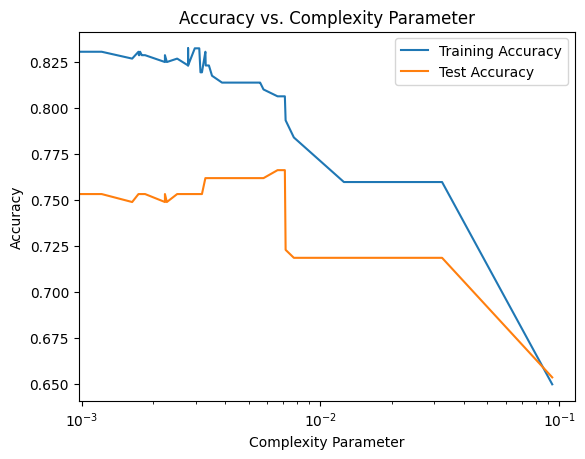

In [44]:
# Addestra l'albero decisionale con diversi valori di complessità
train_accuracy = []
test_accuracy = []
for complexity in ccp_alphas:
    clf = DecisionTreeClassifier(max_depth=5, ccp_alpha=complexity)
    clf.fit(X_train, y_train)
    train_accuracy.append(clf.score(X_train, y_train))
    test_accuracy.append(clf.score(X_test, y_test))

# Plotta l'accuratezza del modello in funzione del parametro di complessità
plt.plot(ccp_alphas, train_accuracy, label='Training Accuracy')
plt.plot(ccp_alphas, test_accuracy, label='Test Accuracy')
plt.xlabel('Complexity Parameter')
plt.ylabel('Accuracy')
plt.title('Accuracy vs. Complexity Parameter')
plt.xscale('log')
plt.legend()
plt.show()

## Assignment

1. Disegnare gli alberi tagliati in accordo al parametro di complessità
2. Provate a creare  altri alberi modificando i parametri nel costruttore DecisionTreeClassifier(). Ad esempio, cosa succede se si cambiano i criteri di splitting? Come varia l'accuratezza?

In [45]:
low_complexity = ccp_alphas[-2]
low_clf = DecisionTreeClassifier(max_depth=5, ccp_alpha=low_complexity)
low_clf.fit(X_train, y_train)

mid_complexity = ccp_alphas[len(ccp_alphas) // 2]
mid_clf = DecisionTreeClassifier(max_depth=5, ccp_alpha=mid_complexity)
mid_clf.fit(X_train, y_train)

high_complexity = ccp_alphas[0]
high_clf = DecisionTreeClassifier(max_depth=5, ccp_alpha=high_complexity)
high_clf.fit(X_train, y_train)

fig, (ax, bx, cx) = plt.subplots(3, 1, figsize=(100, 250))
plot_tree(low_clf, filled=True, ax=ax)
plot_tree(mid_clf, filled=True, ax=bx)
plot_tree(high_clf, filled=True, ax=cx)
plt.plot()

[]

In [65]:
# minimum number of sample to create a split == 50 gives the best accuracy
alt_model = DecisionTreeClassifier(random_state=42, max_depth=5, min_samples_split=50)
alt_model = alt_model.fit(X_train, y_train)

# predizione del nuovo modello
y_pred = alt_model.predict(X_test)
cm = confusion_matrix(y_test, y_pred)

print("Confusion matrix of the alternative model:\n", cm)
print("\nAccuracy of the alternative model:", cm.diagonal().sum() / cm.sum())

Confusion matrix of the alternative model:
 [[121  30]
 [ 32  48]]

Accuracy of the alternative model: 0.7316017316017316
